<a href="https://colab.research.google.com/github/Ayush220501/Lab-1/blob/master/end_to_end_dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install tensorflow==2.15.0 tensorflow-hub==0.16.1 tf_keras==2.15.1


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 23.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 37.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 36.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 41.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 4.4 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.0
    Uninstalling wrapt-1.17.0:
      Successfully uninstalled wrapt-1.17.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: keras
    Found existing installation: keras 3.5.0
    Uninstalling keras-3.5.0:
      Successfully uninstalled ke

# 🐶 End-to-end Multil-class Dog Breed Classification
This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

4. Features
Some information about the data:

We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
There are 120 breeds of dogs (this means there are 120 different classes).
There are around 10,000+ images in the training set (these images have labels).
There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them)

In [2]:
!unzip -o "drive/MyDrive/dog-breed-identification.zip"

Streaming output truncated to the last 5000 lines.
  inflating: train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: train/83fad0718581a696132c96c166472627.jpg  
  inflating: train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  
  inflating: train/840db91ba4600148f3dcb06ec419b421.jpg  
  inflating: train/840dbad5a691c22611d85b2488bf4cbb.jpg  
  inflating: train/8410ced9ebc1759a7ebce5c42bfb5222.jpg  
  inflating: train/84

In [3]:
# Import nescessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version",tf.__version__)
print("TF Hub version",hub.__version__)

#Check for GPU
print("GPU","available(yess)" if tf.config.list_physical_devices("GPU") else "not available")

TF version 2.15.0
TF Hub version 0.16.1
GPU available(yess)


#Getting our data ready (turning into Tensors)
With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [4]:
#check the labels of the data
import pandas as pd
labels_csv=pd.read_csv("/content/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [5]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [6]:
# How many images are there for each breed?
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
brabancon_griffon,67
komondor,67


<Axes: xlabel='breed'>

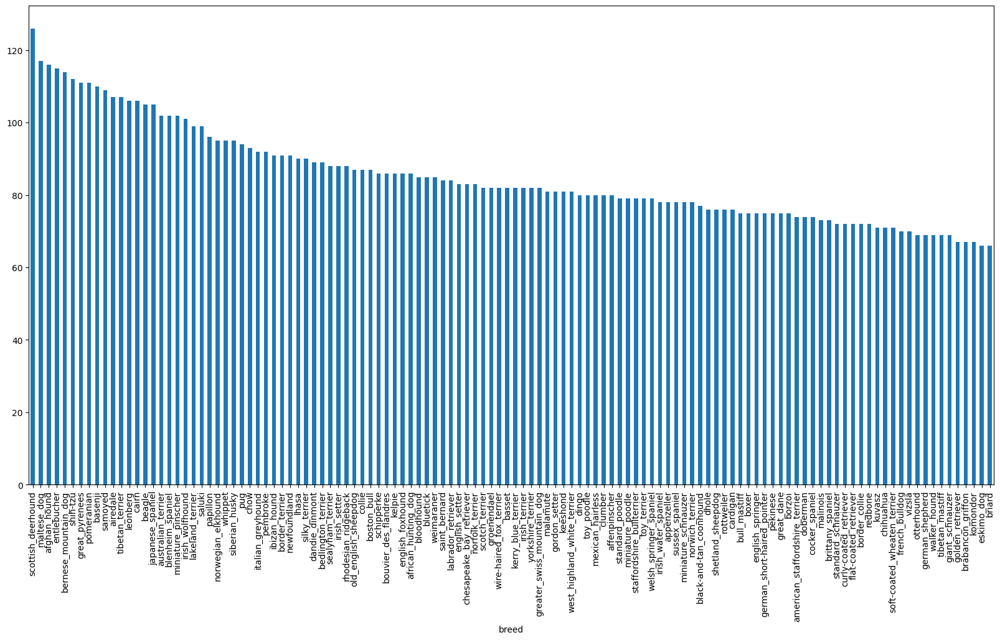

In [7]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [8]:
labels_csv["breed"].value_counts().median()

82.0

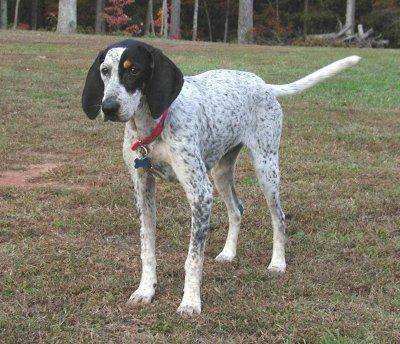

In [9]:
#Lets view an Image
from IPython.display import Image
Image("/content/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

#Getting images and their labels
Let's get a list of all of our image file pathnames.

In [10]:
#Create a pathname from image ID's
filenames=[]

for fname in labels_csv["id"]:
  path="/content/train/"+fname+".jpg"
  filenames.append(path)

#check the first 10
filenames[:10]

['/content/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
#Check whether the number of filenames matches the number of actual images files
import os
if len(os.listdir("/content/train/"))==len(filenames):
  print("Yup! Filenames is matched")
else:
  print("Filenames are not matched")

Yup! Filenames is matched


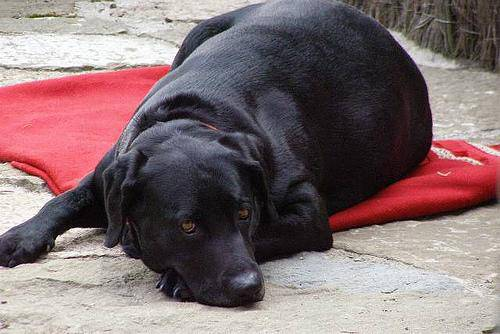

In [12]:
#One more check
Image(filenames[2850])

In [13]:
labels_csv["breed"][2850]

'labrador_retriever'

In [14]:
labels=labels_csv["breed"]
labels

,breed
0,boston_bull
1,dingo
2,pekinese
3,bluetick
4,golden_retriever
...,...
10217,borzoi
10218,dandie_dinmont
10219,airedale
10220,miniature_pinscher


In [15]:
#Turning this into numpy
import numpy as np
labels=labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [16]:
len(labels)

10222

In [17]:
#See if number of labels matches the number of file names
if len(labels) == len(filenames):
  print("It Matches")
else:
  print("It does not matches")

It Matches


In [18]:
#Find the unique number values
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [19]:
#Turn a single label in to array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
#Turn every label into a boolean value
boolean_labels=[label== unique_breeds for label in labels]
boolean_labels[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [21]:
#Turning boolean arrays into integers
print(labels[0]) #original label
print(np.where(unique_breeds==labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
filenames[:20]

['/content/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 '/content/train/004396df1acd0f1247b740ca2b14616e.jpg',
 '/content/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 '/content/train/00693b8bc2470375cc744a6391d397ec.jpg',
 '/content/train/006cc3ddb9dc1bd827479569fcdc52dc.jpg',
 '/content/train/0075dc49dab4024d12fafe67074d8a81.jpg',
 '/content/train/00792e341f3c6eb33663e415d0715370.jpg',
 '/content/train/007b5a16db9d9ff9d7ad39982703e429.jpg',
 '/content/train/007b8a07882822475a4ce6581e70b1f

#Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [23]:
#Setup X and Y variables
X=filenames
y=boolean_labels

In [24]:
#Set number of images to usefor experimenting
NUM_IMAGES=1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [25]:
#Importing Libraries
from sklearn.model_selection import train_test_split

#Results are Reproducible
np.random.seed(42)
#Split into training and validation sets
X_train,X_val,y_train,y_val= train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2)

len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [26]:
#Let's have a geez on our dataset
X_train[:5],y_train[:2]

(['/content/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, F

#Preprocessing Images (turning images into Tensors)
To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image
7. Before we do, let's see what importing an image looks like.

In [27]:
#Convert an image to Numpy Array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
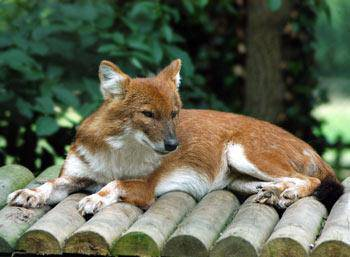

In [28]:
image

In [29]:
#Turning image into Tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

# Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

We'll create a function to:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

More information on loading images in TensorFlow can be seen here: https://www.tensorflow.org/tutorials/load_data/images

In [30]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

# Turning our data into batches
Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: (image, label).

In [31]:
#Create a simple function to return a tuple (image, label).

def get_image_label(image_path,label):
  '''
  Takes an image path file name and the associated label,
  preprocess the image and returns a tuple of (image,label)

  '''

  image = process_image(image_path)

  return image,label

In [32]:
#Demo of the above code
image=process_image(X[42]),tf.constant(y[42])
image

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [33]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [34]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [35]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

#Visualizing Data Batches
Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [36]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

In [37]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [38]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

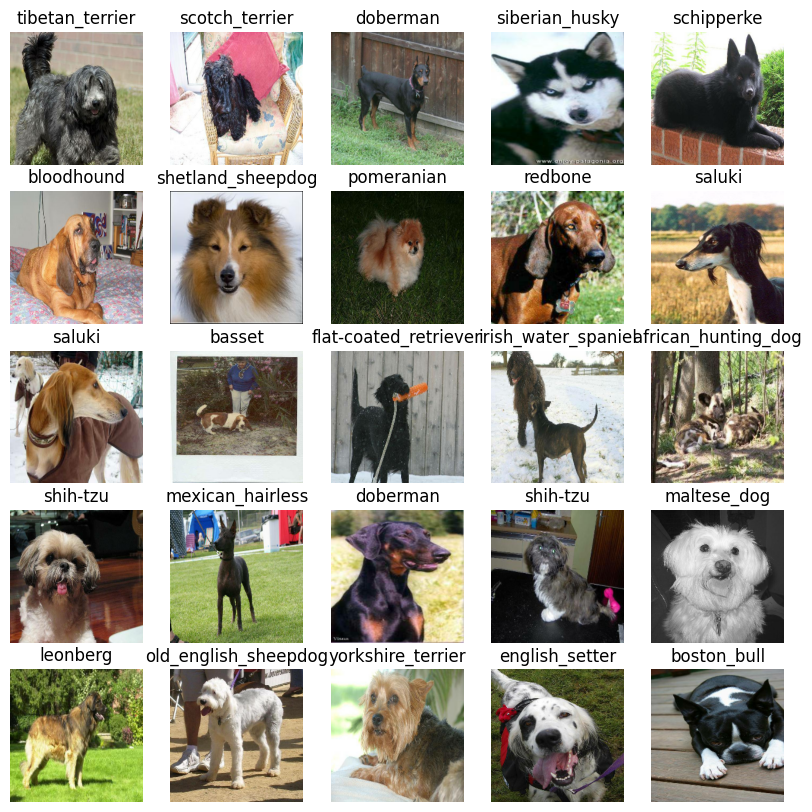

In [39]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

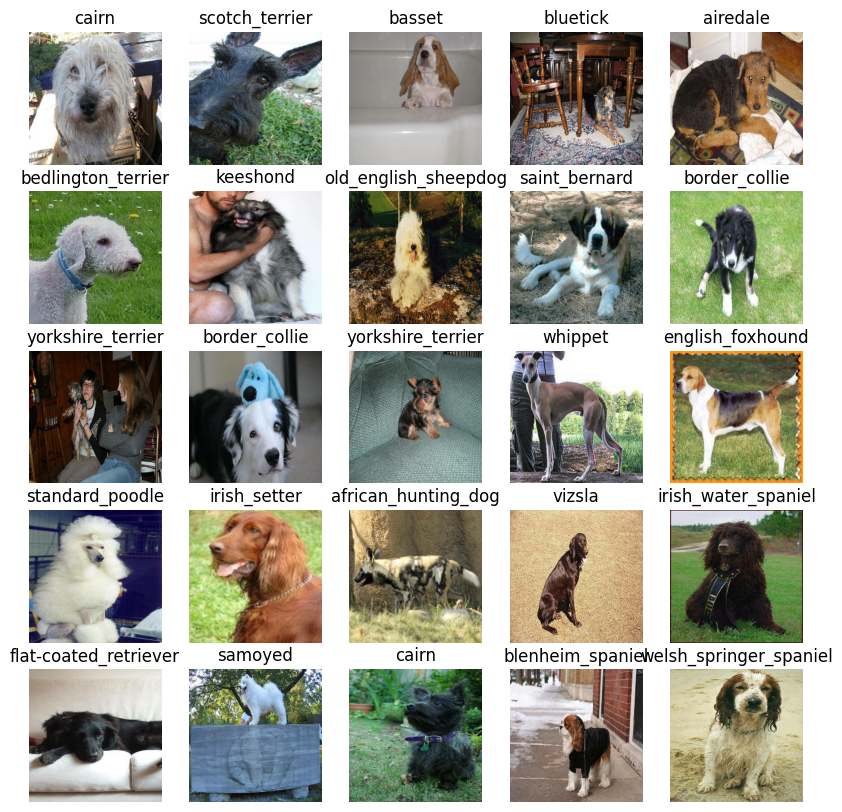

In [40]:
#Now let's visualize in a validation batch
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

# Building a model
Before we build a model, there are a few things we need to define:

The input shape (our images shape, in the form of Tensors) to our model.
The output shape (image labels, in the form of Tensors) of our model.
The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [41]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers, models

#Setup input shape of our model
INPUT_SHAPE=[None ,IMG_SIZE,IMG_SIZE,3] #batch, height, width, color channels

#Setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

#Setup model URL from tensorflow hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

#Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

1. Takes the input shape, output shape and the model we've chosen as parameters.
2. Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
3. Compiles the model (says it should be evaluated and improved).
4. Builds the model (tells the model the input shape it'll be getting).
5. Returns the model.


In [42]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [43]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


#Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

#TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:

Load the TensorBoard notebook extension ✅
Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function. ✅
Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

In [44]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

Make sure to make **logs** before running the further cell

In [45]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

#Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [46]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

# Training a model(on subnet of data)

Our first model is going to train on 1000 images, to make sure everything is working.

In [47]:
NUM_EPOCHS= 100 #@param {type:"slider", min:10, max:100, step:10}

In [48]:
#check if we are still running on a GPU
print("GPU","available (yes !!!!!!!!!!)"if tf.config.list_physical_devices("GPU") else "not available")

GPU available (yes !!!!!!!!!!)


# Let's create a function which trains a Model.
* Create a model using 'create_model()'.
* Setup a TensorBoard Callback using 'create_tensorboard_callback()'.
* Call the 'fit()' function on our model passing it to our training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we would like to use.
* Return the Model

In [49]:
# Build a function to train and returned a train model
def train_model():

  """
  Trains a given model and returns the trained version.
  """

  #Create a model
  model=create_model()

  #Create a Tensorboard session everytime we train a model
  tensorboard=create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks it served
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  #Return the fitted model
  return model

In [50]:
#Fit the model to the data
model=train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 11s 116ms/step - loss: 4.4696 - accuracy: 0.0988 - val_loss: 3.4182 - val_accuracy: 0.2100
Epoch 2/100
25/25 [==============================] - 2s 64ms/step - loss: 1.5715 - accuracy: 0.7075 - val_loss: 2.1936 - val_accuracy: 0.4550
Epoch 3/100
25/25 [==============================] - 2s 74ms/step - loss: 0.5501 - accuracy: 0.9375 - val_loss: 1.6778 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 3s 106ms/step - loss: 0.2504 - accuracy: 0.9887 - val_loss: 1.4867 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 2s 64ms/step - loss: 0.1449 - accuracy: 0.9950 - val_loss: 1.4101 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 2s 76ms/step - loss: 0.1003 - accuracy: 1.0000 - val_loss: 1.3509 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================] -

**Question** : It looks like our model is overfitting because it performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks.

**Note**: Overfitting to begin with is a good thing! it means our model is learning!!!

# Checking the TensorBoard logs
The TensorBoard magic function **(%tensorboard)** will access the logs directory and visualize its contents.

In [51]:
%tensorboard --logdir /content/logs

<IPython.core.display.Javascript object>

# Making and evaluating predictions using trained model.

In [160]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [161]:
# Making Predictions on the validation data (not used to be train on)
predictions=model.predict(val_data,verbose=1) #Verbose means show me your progress
predictions

7/7 [==============================] - 1s 106ms/step


array([[6.83721155e-03, 8.73385870e-04, 1.29944680e-03, ...,
        3.17444035e-04, 3.52278759e-04, 8.70243926e-03],
       [4.00867919e-03, 2.80529610e-03, 2.08930541e-02, ...,
        6.18277059e-04, 4.31951042e-03, 5.83272704e-05],
       [8.80832318e-04, 3.83690960e-04, 4.54503534e-05, ...,
        1.57283037e-04, 1.15109804e-04, 3.88004846e-04],
       ...,
       [2.52735590e-05, 1.75709371e-04, 2.88803421e-04, ...,
        5.88393304e-05, 7.63932418e-04, 7.33977125e-04],
       [8.01903754e-03, 3.53601092e-04, 8.03707517e-05, ...,
        9.39717982e-04, 6.91446403e-05, 1.34066530e-02],
       [7.98732741e-04, 3.06470669e-04, 2.30672536e-04, ...,
        2.91586015e-03, 5.23745839e-04, 1.66608443e-04]], dtype=float32)

In [162]:
predictions[0]

array([6.83721155e-03, 8.73385870e-04, 1.29944680e-03, 1.31956520e-04,
       3.12025164e-04, 4.77963840e-05, 9.70284827e-03, 8.81111482e-04,
       4.81650095e-05, 7.82227493e-04, 3.41386721e-03, 4.15342365e-04,
       2.89338088e-04, 2.23384282e-04, 1.70797086e-03, 1.67313719e-03,
       3.98542979e-05, 3.38439107e-01, 2.60643264e-05, 2.54520390e-04,
       7.99778441e-04, 9.74656577e-05, 2.51247639e-05, 1.35574257e-02,
       2.66543248e-05, 1.19451710e-04, 5.36926761e-02, 1.27662919e-04,
       3.28333757e-04, 2.88413954e-04, 7.57889356e-05, 3.15781683e-03,
       5.73707139e-03, 7.37749797e-05, 1.72490385e-04, 2.39286106e-02,
       5.92930337e-05, 9.55082942e-04, 8.84087276e-05, 2.97568884e-04,
       6.58931502e-04, 1.59781939e-05, 1.85168930e-04, 6.07630995e-04,
       1.56704173e-05, 1.66198995e-04, 3.40763145e-05, 4.56494250e-04,
       3.75056698e-04, 4.64216602e-04, 1.03600381e-04, 3.50212795e-05,
       1.54576628e-04, 4.74778280e-05, 6.26574038e-05, 6.07827445e-04,
      

In [163]:
predictions.shape

(200, 120)

In [164]:
len(y_val),len(unique_breeds)

(200, 120)

In [165]:
#First Predictions
index=1
print(predictions[index])
print(f"Max value (probability of predictions):{predictions[index].max()}")
print(f"Sum:{predictions[index].sum()}")
print(f"Max index: {predictions[index].argmax()}")
print(f"Predicted label:{unique_breeds[predictions[index].argmax()]}")

[4.0086792e-03 2.8052961e-03 2.0893054e-02 2.1372791e-03 5.7820627e-04
 2.1405071e-04 8.3883610e-03 2.1718880e-04 5.8622495e-04 1.1421841e-04
 2.0616216e-04 1.9655581e-05 4.1786698e-04 1.4084393e-05 8.6202941e-05
 1.1566734e-03 5.9522055e-03 2.2432901e-04 4.6400353e-05 3.1647321e-03
 1.3777306e-03 1.4584710e-05 4.9155897e-05 2.2280635e-04 1.2745874e-04
 1.2908940e-04 5.6211296e-02 1.9658094e-03 2.5178021e-04 2.3949989e-04
 1.8301311e-04 7.5754557e-05 3.0372548e-03 1.8210654e-04 5.7730952e-04
 2.5174971e-04 8.8852074e-04 1.7753782e-03 1.0094343e-04 5.5868826e-05
 1.7826591e-04 2.3559135e-04 2.8756260e-05 5.8150652e-04 5.8988034e-04
 5.8921133e-03 1.0181109e-03 5.9419929e-04 1.8396955e-02 1.5636691e-04
 1.2096081e-04 2.6977036e-04 1.0998413e-05 9.0597008e-05 5.3138414e-04
 3.3238160e-03 1.0232933e-05 9.1921352e-03 1.0704205e-04 5.7690581e-03
 6.8314676e-04 4.0067258e-05 8.9261106e-05 2.1619522e-03 5.6452509e-03
 1.7072838e-04 6.3591957e-05 5.0585275e-04 2.3686081e-04 1.7730787e-05
 2.608

Having the above functionality is great but we want to able to do it at scale
And it would better if we could see the image the predictions is being made on.

**Note**: Predictions Probabilities are also known as confidence intervals

In [166]:
#Turn Prediction probablities into thier respective label(which is easier to understand)

def get_pred_label(prediction_probabilities):
  """
Turns an array of prediction probabilities into a label

"""

  return unique_breeds[np.argmax(prediction_probabilities)]

#Get a predicted label based on array of predicted probabilities
pred_label=get_pred_label(predictions[22])
pred_label

'cairn'

Now since our validation data is still in batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [167]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [168]:
#Create a function to unbatch a batch dataset
def unbatchify(data):

  '''
Take a batched dataset of (image,label) and returns seperate arrays of images and labels.

  '''

  images=[]
  labels=[]

  #Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
   images.append(image)
   labels.append(unique_breeds[np.argmax(label)])

  return images,labels

#Unbatchify the validation data
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have got the ways to get:
* Prediction Labels
* Validation Labels (truth labels)
* Validation Images

Now lets develop a function to make it more visualize.

we'll create a function which:
* Takes an array of predicition probabilities, an array of truth labels and an array of images and integer.
* Convert the prediction probabilities in to a predicted label.
* Plot the predicted label, its predicted probablility and target image on a single plot.

In [169]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  '''
  View the prediction, ground truth and image for sample n

  '''

  pred_probe,true_label,image= prediction_probabilities[n],labels[n],images[n]

  #Get the Pred Label
  pred_label=get_pred_label(pred_probe)

  #Plot images and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Applying color if the predictions is true it is change to green or red
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  #Change the plot title to be predicted, probabiloty of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_probe)*100,
                                    true_label),
                                    color=color)

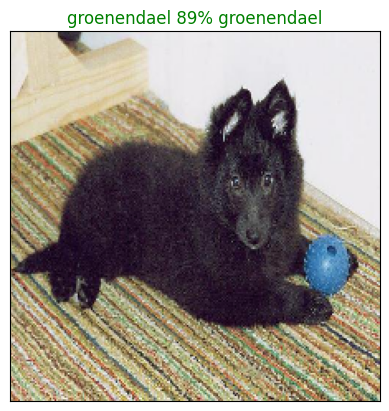

In [170]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we have got one function to visualize our models top predictions. Let's make others to view top 10 predictons.

This function will:
* Take an input of predicted probabilities array and a ground truth array and a label.

* Find the prediction using get_pred_label()

* Find the top 10:
      1. Prediction Probability Indexes
      2. Prediction Probability Values
      3. Prediction Labels


* Plot the top 10 prediction probability values and labels, coloring the true greenth label.





In [171]:
def plot_pred_conf(prediction_probabilities, labels,n=1):

  '''
  Plus the top 10 highest prediction confidences along with the truth label for sample n.

  '''

  pred_prob,true_label=prediction_probabilities[n],labels[n]

  #Get the predicted Labels
  pred_label=get_pred_label(pred_prob)

  #Find the top 10 prediction confidence intervals
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]

  #Find the top 10 prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]

  #Find the top 10 prediction labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  #Setup Plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  #Change color of the true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

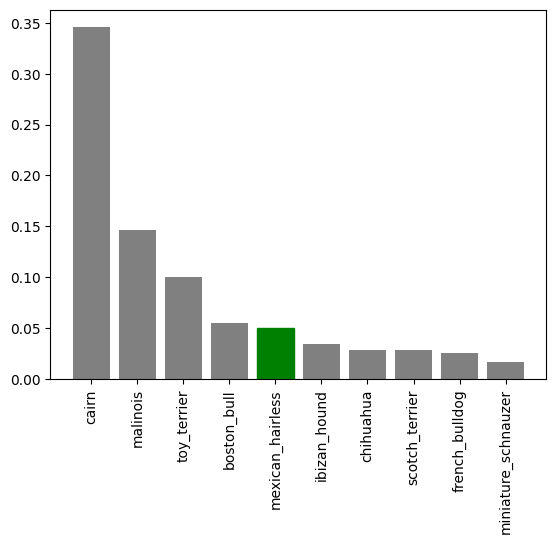

In [172]:
plot_pred_conf(prediction_probabilities=predictions,  # Corrected spelling
               labels=val_labels,
               n=33)


Now 've got some functions to help us visualize our predictions and evaluate oour model, let's check out a few.

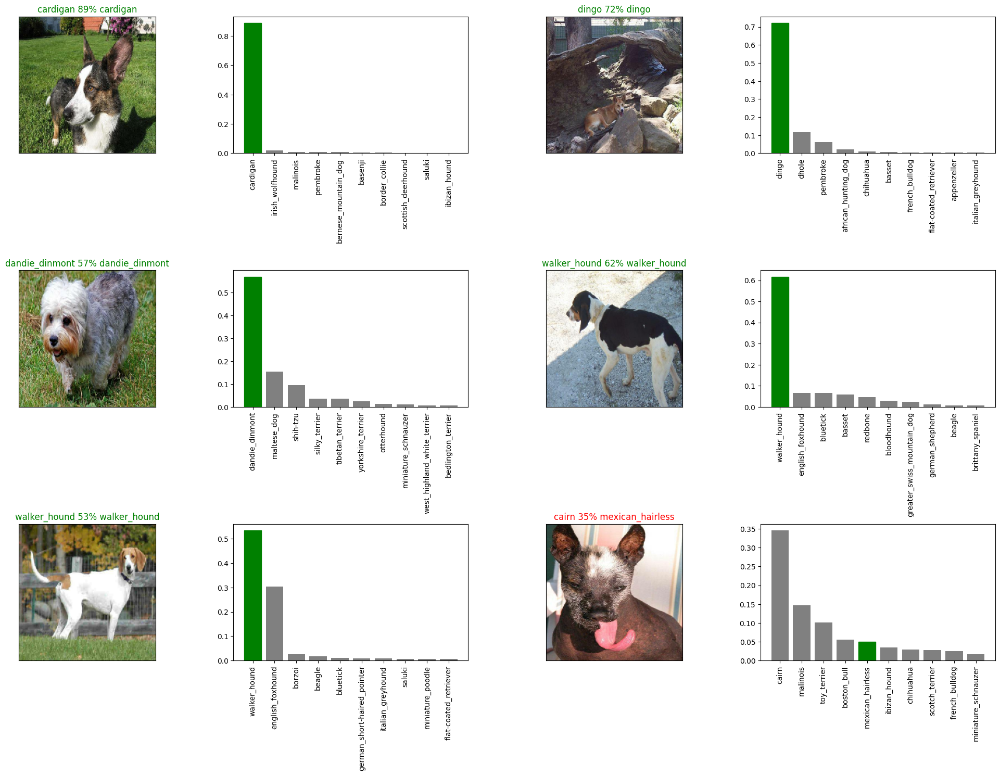

In [173]:
#Let's check out a few predictions and their values

i_multiplier=28
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows,2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
             n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1)
plt.show()

**Challenge** : How would you create a confusion matrix with our models predictions and truth labels?

# Saving and Reloading a Trained Model

In [66]:
#Create a Function to save a model

def save_model(model,suffix=None):
  '''
  Saves a given model in a models directory and appends a suffix (string).
  '''


  #Create a model directory pathname with current time

  modeldir=os.path.join("/content/model",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  model_path=modeldir + "-" + suffix + ".h5" #save format of a model

  print(f"Saving model to : {model_path}...")
  model.save(model_path)

  return model_path

In [67]:
#Create a function to load a trained model
def load_model(model_path):
  '''
  Loads a saved model from a specified path.

  '''

  print(f"Loading Saved model from {model_path}")

  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work.

In [68]:
#Save our model to work on 1000 images.
save_model(model=model,suffix="1000-images-mobilevNet02-Adam")

Saving model to : /content/model/20241229-213511-1000-images-mobilevNet02-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/model/20241229-213511-1000-images-mobilevNet02-Adam.h5'

In [70]:
# Load a Trained Model
loaded_100_image_model=load_model("/content/model/20241229-213511-1000-images-mobilevNet02-Adam.h5")

Loading Saved model from /content/model/20241229-213511-1000-images-mobilevNet02-Adam.h5


In [71]:
#Evaluate a pre saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 77ms/step - loss: 1.2955 - accuracy: 0.6600


[1.2955087423324585, 0.6600000262260437]

In [72]:
#Evaluate the loaded model
loaded_100_image_model.evaluate(val_data)

7/7 [==============================] - 1s 83ms/step - loss: 1.2955 - accuracy: 0.6600


[1.2955087423324585, 0.6600000262260437]

# Training a big dog model 🐶 (on the full dataset)

In [73]:
len(X),len(y)

(10222, 10222)

In [74]:
# Create a full data batch with the full data set
full_data=create_data_batches(X,y)

Creating training data batches...


In [75]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [76]:
#Create a model on full data
full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [77]:
#Create full model callbacks
full_model_tensorboard=create_tensorboard_callback()

#No validation set when training on all of the data, so we can't monitor accuracy.
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                            patience=3)


**Note** : Running the cell below will take a little while (may be upto 30 minutes on first epoch) because the GPU we'r using in the run time has to load all of the images in the memory.

In [78]:
#Fit the full model on the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 27s 69ms/step - loss: 1.3098 - accuracy: 0.6751
Epoch 2/100
320/320 [==============================] - 21s 65ms/step - loss: 0.3967 - accuracy: 0.8822
Epoch 3/100
320/320 [==============================] - 20s 63ms/step - loss: 0.2338 - accuracy: 0.9355
Epoch 4/100
320/320 [==============================] - 20s 63ms/step - loss: 0.1495 - accuracy: 0.9660
Epoch 5/100
320/320 [==============================] - 20s 63ms/step - loss: 0.1072 - accuracy: 0.9766
Epoch 6/100
320/320 [==============================] - 20s 62ms/step - loss: 0.0760 - accuracy: 0.9867
Epoch 7/100
320/320 [==============================] - 20s 63ms/step - loss: 0.0573 - accuracy: 0.9913
Epoch 8/100
320/320 [==============================] - 20s 62ms/step - loss: 0.0472 - accuracy: 0.9932
Epoch 9/100
320/320 [==============================] - 20s 63ms/step - loss: 0.0367 - accuracy: 0.9966
Epoch 10/100
320/320 [==============================] - 21s 64ms/step - l

In [79]:
save_model(full_model,suffix=("full-image-mobilenetv2-Adam"))

Saving model to : /content/model/20241229-214217-full-image-mobilenetv2-Adam.h5...


'/content/model/20241229-214217-full-image-mobilenetv2-Adam.h5'

In [81]:
#Load the full model
full_model=load_model("/content/model/20241229-214217-full-image-mobilenetv2-Adam.h5")

Loading Saved model from /content/model/20241229-214217-full-image-mobilenetv2-Adam.h5


#Make Predictions on the test dataset

Since our model has been trained on images in the form of Tensor Batches , to make predictions on the test data, we'll have to get it in the same format.

Luckily we created 'create_data_batches()' earlier which can take a list of filenames as input and convert them into Tensor Batches.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filename into test data batches using '' create_data_batches()'' and setting the 'test_data' parameter to 'True'(since the test data parameter does not have labels)
* Make a prediction array by passing the test batches to the 'predict()' method on our model.

In [82]:
# Load test image filenames
test_path="/content/test"
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/testf7fda1184e21dcd0cb94086cac9ee762.jpg',
 '/content/test99c85e92f484f931d0fcccf6e062c73d.jpg',
 '/content/test54ecb469a09aade9392bd267ec600034.jpg',
 '/content/testbd4211cd31953f8ada0a80791a37cf73.jpg',
 '/content/testf16ce30657f7dec9cf08597bbce2ffdb.jpg',
 '/content/test99a7b1c05146b4ba6af490cd981ed687.jpg',
 '/content/testde90fcd52b9c527ea097d88804985516.jpg',
 '/content/test19905a98817ec6df4765ad5713558a76.jpg',
 '/content/test1217ee8c4a27f7d7d3c2175baac8afc2.jpg',
 '/content/test3bf061e6985f4b74f622cc54bb1cd5fd.jpg']

In [83]:
len(test_filenames)

10357

In [84]:
#Create test data batches
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [85]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

** Note **: Since there are 10,000+ test images, making predictions could take a while, even on a GPU. So beware running the cell below may take up to an hour.

In [92]:
import os

test_path = "/content/test/"  # Include trailing slash
test_filenames = [test_path + fname for fname in os.listdir(test_path) if fname.endswith(".jpg")]
print(test_filenames[:10])  # Verify the constructed paths


['/content/test/f7fda1184e21dcd0cb94086cac9ee762.jpg', '/content/test/99c85e92f484f931d0fcccf6e062c73d.jpg', '/content/test/54ecb469a09aade9392bd267ec600034.jpg', '/content/test/bd4211cd31953f8ada0a80791a37cf73.jpg', '/content/test/f16ce30657f7dec9cf08597bbce2ffdb.jpg', '/content/test/99a7b1c05146b4ba6af490cd981ed687.jpg', '/content/test/de90fcd52b9c527ea097d88804985516.jpg', '/content/test/19905a98817ec6df4765ad5713558a76.jpg', '/content/test/1217ee8c4a27f7d7d3c2175baac8afc2.jpg', '/content/test/3bf061e6985f4b74f622cc54bb1cd5fd.jpg']


In [98]:
import tensorflow as tf
import os

# Define your test directory
test_path = "/content/test/"  # Make sure this directory contains images

# Ensure the directory contains the right structure
print(f"Files in {test_path}:")
print(os.listdir(test_path))

# Create a dataset from your directory
test_data = tf.keras.preprocessing.image_dataset_from_directory(
    test_path,
    label_mode=None,  # We don't need labels for prediction
    image_size=(224, 224),  # Make sure this matches the model's input size
    batch_size=32,  # Adjust batch size as needed
    shuffle=False  # Don't shuffle for prediction
)

# Print the shape of the dataset to verify it's loading correctly
for images in test_data.take(1):
    print(images.shape)  # It should show something like (batch_size, 224, 224, 3)

# Make predictions
predictions = loaded_100_image_model.predict(test_data, verbose=1)

# Output the predictions
print(predictions)



Files in /content/test/:
['f7fda1184e21dcd0cb94086cac9ee762.jpg', '99c85e92f484f931d0fcccf6e062c73d.jpg', '54ecb469a09aade9392bd267ec600034.jpg', 'bd4211cd31953f8ada0a80791a37cf73.jpg', 'f16ce30657f7dec9cf08597bbce2ffdb.jpg', '99a7b1c05146b4ba6af490cd981ed687.jpg', 'de90fcd52b9c527ea097d88804985516.jpg', '19905a98817ec6df4765ad5713558a76.jpg', '1217ee8c4a27f7d7d3c2175baac8afc2.jpg', '3bf061e6985f4b74f622cc54bb1cd5fd.jpg', '39cc7e1bcef4b568e1f2926a2932f141.jpg', '86ac1689bfb7e42138f398c3b569ac82.jpg', '2156a62d73ee41b97dc42551cce09f4c.jpg', 'd62563564b7bb7ccaa1f85206c232301.jpg', '98846d2e716f0d2728d9a5fcf98d8f86.jpg', 'aaae20eed76f8015d6994955bc30076c.jpg', '3bb5b0beec0daeeb1d45f8009c27741c.jpg', '76a6bc74f5ccf814e8928139eafb57b1.jpg', 'a2e03e4bca79b6858bdc707142dd8391.jpg', 'eb0376e08d0575939eb1018313fab05b.jpg', '0f15c5e059726aba8d1c3341ffb14881.jpg', '5206d48eb4adfaee7d87d1a07de368b0.jpg', 'fb2cb63322ef0e9a7ade9ecd93921eb2.jpg', '95e3e9ba43d04118216b9fe20f132eaa.jpg', 'c228e7120995a

In [99]:
#Make Predictions on the test data batch using loaded full model
test_predictions= loaded_100_image_model.predict(test_data,verbose=1)

324/324 [==============================] - 22s 67ms/step


In [100]:
#Save Predictions (Numpy Array) to csv file (for later access)
np.savetxt("/content/predictions.csv",test_predictions,delimiter=",")

In [101]:
# Load Predictions (Numpy Array) to a csv file
test_predictions=np.loadtxt("/content/predictions.csv",delimiter=",")

In [102]:
test_predictions[:10]

array([[4.06907493e-04, 2.36318010e-05, 6.09420519e-03, ...,
        6.65119791e-04, 5.75075719e-05, 5.58505487e-03],
       [3.01125436e-03, 2.16741042e-04, 1.18025078e-03, ...,
        4.43179673e-03, 5.70440840e-04, 7.81816710e-03],
       [7.95182958e-03, 1.52122491e-04, 4.59252996e-03, ...,
        1.25199521e-03, 1.49124578e-04, 6.32848358e-03],
       ...,
       [1.65903347e-03, 3.01637541e-04, 1.76952537e-02, ...,
        7.00162142e-04, 1.91525964e-04, 3.67259909e-03],
       [1.39025534e-02, 6.55608092e-05, 6.78613335e-02, ...,
        8.02004419e-04, 9.08047223e-05, 8.71228706e-03],
       [7.79308518e-03, 4.82429023e-05, 1.86273530e-02, ...,
        5.53026912e-04, 1.82049451e-04, 5.80727449e-03]])

To make predictions on custom images, we will


*   Get the filepaths of our images.

*   Turn the filepath into data batches using create_data_batches(). And since our custom image don't have labels we set the test_data Parameters to True.

*   Pass the Custom image data batch to our model predict() method.

*   Convert the prediction output probabilities to prediction labels.

*   Compare the predicted labels to our custom images.









In [138]:
#Get custom image filepaths
custom_path = "/content/my-dog-photos/"  # Ensure there's a trailing slash
custom_image_paths = [os.path.join(custom_path, fname) for fname in os.listdir(custom_path) if fname.endswith('.jpg')]

custom_image_paths


['/content/my-dog-photos/istockphoto-1808810198-1024x1024.jpg',
 '/content/my-dog-photos/IMG_0059 (1).jpg']

In [139]:
#Turn custom images into a batch datasets
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [140]:
#Make Predictions on Custom Data
custom_preds=loaded_100_image_model.predict(custom_data)

1/1 [==============================] - 1s 825ms/step


In [141]:
custom_preds

array([[5.41592499e-06, 1.84961518e-05, 2.10560218e-04, 9.87043040e-06,
        4.77374764e-04, 1.53112502e-04, 3.32699536e-04, 4.20040730e-03,
        1.82971402e-04, 1.97858506e-04, 4.51177548e-05, 2.64596834e-04,
        1.22774481e-05, 2.09073522e-04, 1.08585291e-05, 1.45354315e-05,
        5.40910638e-04, 2.04849086e-04, 4.76698951e-05, 1.84163946e-04,
        5.55193174e-06, 1.36446281e-04, 1.09673692e-05, 3.71644965e-05,
        1.47518073e-03, 2.04951284e-04, 5.73512480e-05, 5.74479764e-03,
        2.41056841e-05, 9.64671257e-04, 1.52048975e-04, 4.69317547e-06,
        4.15012510e-05, 1.74372969e-03, 1.93104606e-05, 3.87191074e-04,
        2.69967531e-05, 1.64483562e-02, 3.22984306e-05, 1.91594276e-03,
        1.10381761e-05, 1.03980847e-05, 1.36143557e-04, 6.00304687e-04,
        3.19806510e-04, 5.29952231e-05, 5.02630137e-04, 1.52183220e-05,
        2.69243210e-05, 9.19713930e-04, 2.65610270e-05, 3.83856022e-05,
        1.52570055e-05, 1.79011677e-05, 1.72412387e-04, 1.293806

In [142]:
#Get Custom Image prediction labels
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['pembroke', 'bull_mastiff']

In [143]:
#Get custom images
custom_images=[]

#Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

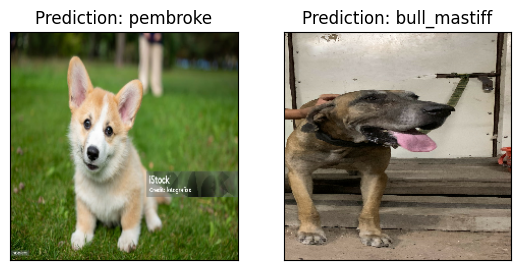

In [144]:
#Check Custom Image Predictions
plt.figure(figsize=(10,10))

for i,image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(f"Prediction: {custom_pred_labels[i]}")
  plt.imshow(image)